<a href="https://colab.research.google.com/github/recozers/TCAV/blob/main/TCAV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Statistical hypothesis testing in neural networks

Leapoards and Cheetahs look very similar. Theyre both big cats with spots, and as a result many people confuse the two. The best way to tell them apart is the 'tear' marks on Cheetah's.

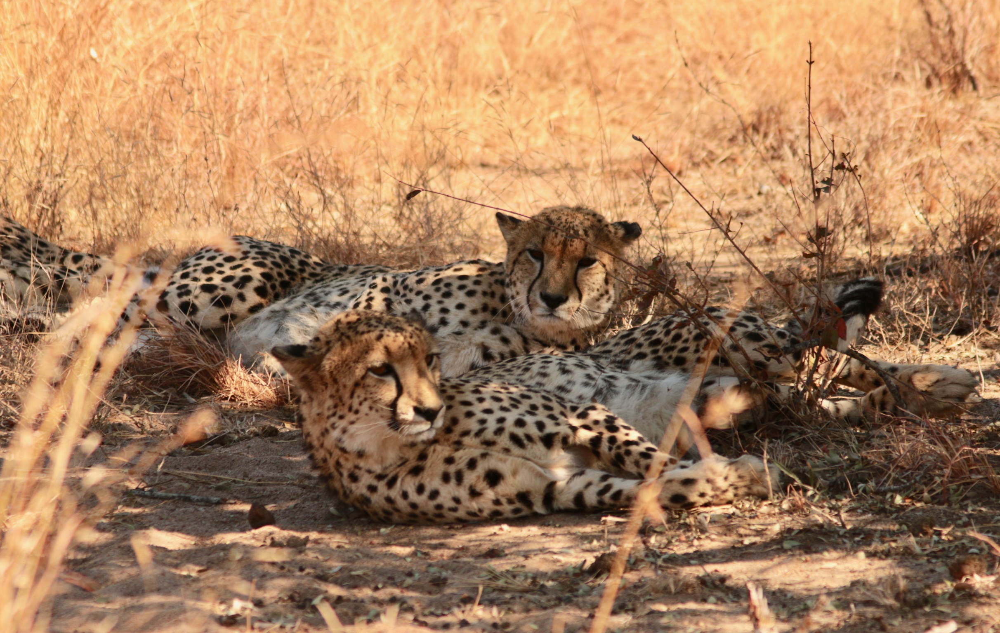

Here's two Cheetah's, you can see they have these really elegeant stripes from their eyes down that look a little bit like tear marks.

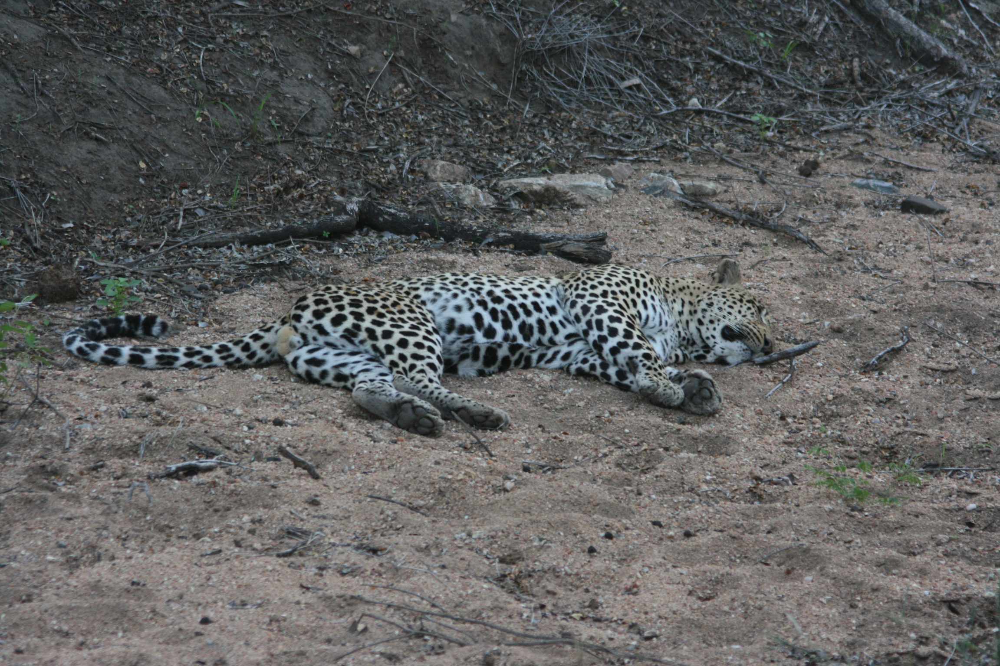

This is what a Leopard looks like by contrast (Don't worry, only sleeping!). You can see that by contrast these marks are not present. There are also differences in spots, but the most obvious difference is those marks.

Now even though we term them 'tear marks' they're not actually tears, nor do they really look anything like tears in the direct sense. So what they really look like in the most direct sense are stripes. Therefore the hypothesis we will be testing is whether the model uses the concept of 'stripes' to identify Cheetah's. H0 is that the concept of stripes is not used. and H1 is the concept of stripes is used. My prediction is that the concept will not be used.

In [ ]:
# Lets start by cloning the TCAV repo
!git clone https://github.com/tensorflow/tcav.git

fatal: destination path 'tcav' already exists and is not an empty directory.


In [ ]:
!pip install tcav tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 2.9 MB/s eta 0:00:00


We're going to make use of this code from the example [notebook](https://github.com/AIPI-590-XAI/Duke-AI-XAI/blob/main/explainable-ml-example-notebooks/testing_concept_activation_vectors.ipynb). I manually changed the code to 'Cheetah' and took out 'zigzagged'. You may have to redo this when you clone the repo.

In [ ]:
%cd /content/tcav/tcav/tcav_examples/image_models/imagenet
%run download_and_make_datasets.py --source_dir=YOUR_FOLDER --number_of_images_per_folder=10 --number_of_random_folders=3

%cd /content/tcav

/content/tcav/tcav/tcav_examples/image_models/imagenet
Created source directory at YOUR_FOLDER
Downloaded 10 for cheetah
Successfully created data at YOUR_FOLDER
/content/tcav


Lets load all the necessary libraries

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tcav.model import KerasModelWrapper
from tcav.tcav import TCAV
import tcav.utils as utils
import logging

# Suppress TensorFlow warnings
logging.getLogger('tensorflow').setLevel(logging.ERROR)

In [ ]:
source_dir = '/content/tcav/tcav/tcav_examples/image_models/imagenet/YOUR_FOLDER'

# Provide the exact paths for the concept folders
concepts_paths = {
    'dotted': '/content/tcav/tcav/tcav_examples/image_models/imagenet/YOUR_FOLDER/dotted',
    'striped': '/content/tcav/tcav/tcav_examples/image_models/imagenet/YOUR_FOLDER/striped'  # Adjust as needed
}

# Random concept folders
random_folders = ['/content/tcav/tcav/tcav_examples/image_models/imagenet/YOUR_FOLDER/random500_0',
                  '/content/tcav/tcav/tcav_examples/image_models/imagenet/YOUR_FOLDER/random500_1']

# Define the target class folder
target = 'cheetah'
target_dir = os.path.join(source_dir, target)
cav_dir = os.path.join(source_dir, 'cavs')

# Create necessary directories if they don't exist
os.makedirs(target_dir, exist_ok=True)
os.makedirs(cav_dir, exist_ok=True)

Now lets make a function that will help us load and preprocess the images

In [ ]:
def load_images_from_folder(folder_path, target_size=(299, 299)):
    images = []
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(folder_path, filename)
            try:
                img = load_img(img_path, target_size=target_size)
                img = img_to_array(img)
                img = tf.keras.applications.inception_v3.preprocess_input(img)
                images.append(img)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
    return np.array(images)

In [ ]:
concept_images = {}
for concept, concept_path in concepts_paths.items():
    if os.path.exists(concept_path):
        images = load_images_from_folder(concept_path)
        concept_images[concept] = images
        print(f"Loaded {images.shape[0]} images for concept '{concept}'.")
    else:
        print(f"Concept folder '{concept}' does not exist at '{concept_path}'.")


Loaded 10 images for concept 'dotted'.
Loaded 10 images for concept 'striped'.


In [ ]:
random_images = []
for random_folder in random_folders:
    if os.path.exists(random_folder):
        images = load_images_from_folder(random_folder)
        random_images.append(images)
        print(f"Loaded {images.shape[0]} images from random concept folder '{random_folder}'.")
    else:
        print(f"Random concept folder '{random_folder}' does not exist.")
random_images = np.concatenate(random_images, axis=0)

Loaded 8 images from random concept folder '/content/tcav/tcav/tcav_examples/image_models/imagenet/YOUR_FOLDER/random500_0'.
Loaded 5 images from random concept folder '/content/tcav/tcav/tcav_examples/image_models/imagenet/YOUR_FOLDER/random500_1'.


In [ ]:
if os.path.exists(target_dir):
    target_images = load_images_from_folder(target_dir)
    print(f"Loaded {target_images.shape[0]} images for target class '{target}'.")
else:
    print(f"Target class folder for '{target}' does not exist at '{target_dir}'.")


Loaded 9 images for target class 'cheetah'.


In [ ]:
# Basic
import os
import absl
import random
import matplotlib.pyplot as plt
from PIL import Image

# Models
import tensorflow as tf

#XAI
import tcav.activation_generator as act_gen
import tcav.cav as cav
import tcav.model  as model
import tcav.tcav as tcav
import tcav.utils as utils
import tcav.utils_plot as utils_plot

In [ ]:
# Model wrapper (InceptionV3 and GoogleNet are provided in model.py)
model_to_run = 'GoogleNet'

def display_random_images(directory, num_images):
    # Get list of files in the directory
    files = os.listdir(directory)

    # Filter out non-image files
    image_files = [f for f in files if f.endswith('.jpg')]

    # Check if there are enough image files
    if len(image_files) < num_images:
        print(f"Not enough images in {directory}.")
        return

    # Select random images
    random_images = random.sample(image_files, num_images)

    # Display selected images
    fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
    for i, image_file in enumerate(random_images):
        image_path = os.path.join(directory, image_file)
        image = Image.open(image_path)
        axs[i].imshow(image)
        axs[i].axis('off')
    plt.show()

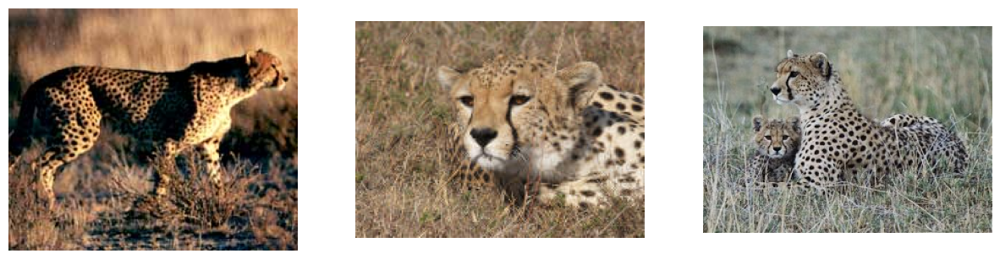

In [ ]:
display_random_images(target_dir,3)

Here are some of the images in the cheetah class

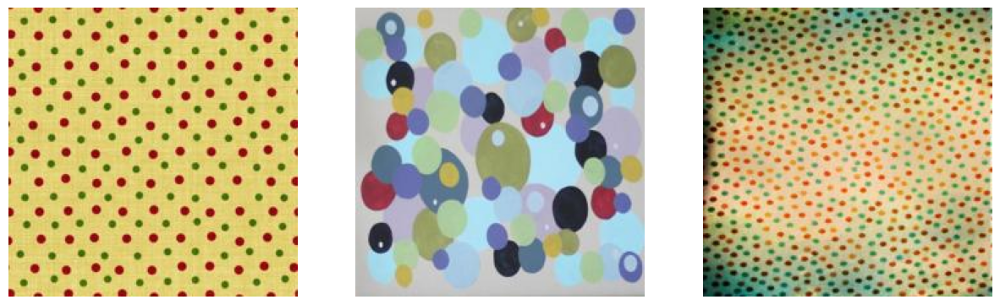

In [ ]:
display_random_images(concepts_paths['dotted'],3)

Here are some of the images from the dotted folder

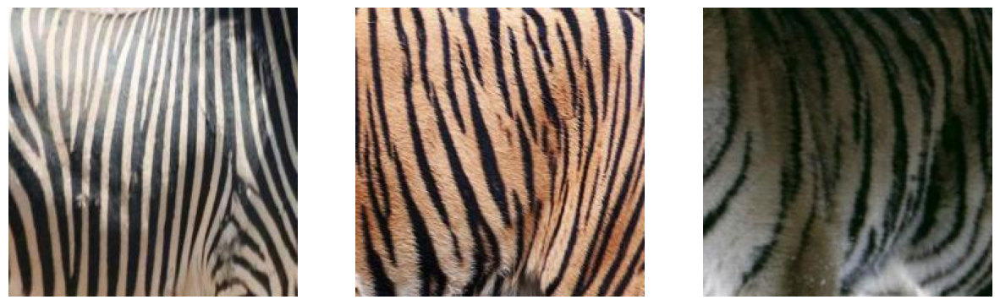

In [ ]:
display_random_images(concepts_paths['striped'],3)

Here are some of the images from the striped folder

ImportError: cannot import name 'TCAV' from 'tcav' (unknown location)